In [8]:
#import tensorlayer as tl
def PSNR(y_true, y_pred):
    max_pixel = 1.0
    return (10.0 * K.log((max_pixel ** 2) / (K.mean(K.square(y_pred - y_true), axis=-1)))) / 2.303
def compute_psnr(original_image, generated_image):
    original_image = tf.convert_to_tensor(original_image, dtype = tf.float32)
    generated_image = tf.convert_to_tensor(generated_image, dtype = tf.float32)
    psnr = tf.image.psnr(original_image, generated_image, max_val = 1.0)
    return tf.math.reduce_mean(psnr, axis = None, keepdims = False, name = None)
def compute_ssim(original_image, generated_image):
    original_image = tf.convert_to_tensor(original_image, dtype = tf.float32)
    generated_image = tf.convert_to_tensor(generated_image, dtype = tf.float32)
    ssim = tf.image.ssim(original_image, generated_image, max_val = 1.0, filter_size = 11, filter_sigma = 1.5, k1 = 0.01, )
    return tf.math.reduce_mean(ssim, axis = None, keepdims = False, name = None)

#### Data Pre-processing

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

print(np.__version__)
print(tf.__version__)
print(cv2.__version__)

def load_data(path,size):
    high_res_images = []
    low_res_images = []
    count = 0
    for (dirname, _, filenames_high_res),(dirname, _, filenames_low_res) in zip(os.walk(path+'HIGH'),os.walk(path+'LOW')):
        filenames_high_res.sort()
        filenames_low_res.sort()
        
        for filename_high,filename_low in zip(filenames_high_res,filenames_low_res):
            #faulty image
            
            try:
                count+=1
                img = cv2.imread(os.path.join(dirname, filename_high))
                img_2 = cv2.imread(os.path.join(dirname, filename_low))
                # resizing the images
                width=int(img.shape[1])
                height=int(img.shape[0])
                
                width_2= int(img_2.shape[1])
                height_2=int(img_2.shape[0]) 
            
                if width!= 512 and height !=512:
                    dsize=(512,512)
                    img=cv2.resize(img,dsize)
                  
                if width_2!= 256 and height_2 !=256:
                    dsize=(256,256)
                    dsize_1 = (128,128)
                    img_2 = cv2.resize(img_2,dsize_1,interpolation=cv2.INTER_AREA)
                    img_2 = cv2.resize(img_2,dsize,interpolation=cv2.INTER_AREA)
                    #img_2=cv2.resize(img_2,dsize)
                    img_2 = np.array(img_2)+ np.random.rand(256,256,3)*50
                
                img = process_image(img)
                img_2 = process_image(img_2)
                high_res_images.append(img)
                low_res_images.append(img_2)
            except:
                continue
            if count >size:
                break
    
    # zero-mean and zero-center the standard deviations ....
    low_res_array = np.array(low_res_images)
    #mean_centered_low_res = (low_res_array - low_res_array.mean())/low_res_array.std()
    
    # zero-mean and zero-center the standard deviations .....
    high_res_array = np.array(high_res_images)
    #mean_centered_high_res = (high_res_array - high_res_array.mean())/high_res_array.std()
    
    
    #return mean_centered_low_res, mean_centered_high_res
    return low_res_array,high_res_array

def process_image(image):
    return image/255

1.18.5
2.3.1
4.5.1


In [4]:
base_dir = ''
#train_x, train_y =  load_data(path=base_dir+'Training/',size=7000)
val_x, val_y = load_data(path=base_dir+'Validationing/',size=7000)

In [5]:
train_x.shape

(7000, 256, 256, 3)

In [6]:
train_y.shape

(7000, 512, 512, 3)

In [3]:
val_x.shape

NameError: name 'val_x' is not defined

In [13]:
val_y.shape

(255, 512, 512, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


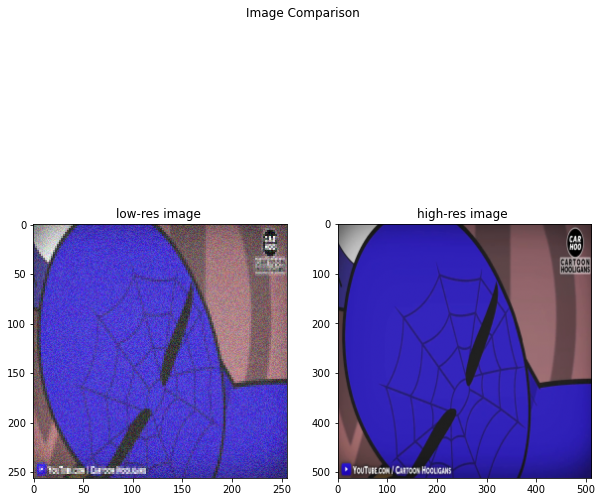

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,10))
fig.suptitle('Image Comparison')
ax1.imshow(train_x[30])
ax1.title.set_text("low-res image ")
ax2.imshow(train_y[30])
ax2.title.set_text("high-res image ")

In [4]:
##Show the VAE function
### Modifying the train_step
from tensorflow.keras.layers import BatchNormalization
import tensorflow.keras as keras
## The fully convolutional encoder-decoder network and then creating a new loss function with the VGG_19 loss
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
import tensorflow as tf

class VGG(keras.Model):
    def __init__(self, decoder,compute_psnr,compute_sims, **kwargs):
        super(VGG, self).__init__(**kwargs)
        self.decoder = decoder
        self.compute_psnr = compute_psnr
        self.compute_ssim = compute_sims
        #self.vgg_loss = vgg_loss
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        #self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        #self.vgg_loss_tracker = keras.metrics.Mean(name="vgg_loss")
        self.ssim_tracker = keras.metrics.Mean(name='ssim_loss')
        self.psnr_tracker = keras.metrics.Mean(name='psnr_loss')
        
        self.val_total_loss_tracker = keras.metrics.Mean(name="val_total_loss")
        #self.val_reconstruction_loss_tracker = keras.metrics.Mean(name="val_reconstruction_loss")
        #self.val_vgg_loss_tracker = keras.metrics.Mean(name="val_vgg_loss")
        self.val_ssim_tracker = keras.metrics.Mean(name='val_ssim_loss')
        self.val_psnr_tracker = keras.metrics.Mean(name='val_psnr_loss')

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.ssim_tracker,
            self.psnr_tracker
            #self.reconstruction_loss_tracker,
            #self.vgg_loss_tracker,
        ]
    
    def call(self, data, training = False):
        
        reconstruction = self.decoder(data) # data is a tuple of encoder_inputs,dim_encoding_2,latent_ratio
        return reconstruction
    
    def train_step(self, data):
        
        with tf.GradientTape() as tape:
            train_x,pred_x = data
            reconstruction = self.decoder(train_x) # data is a tuple of encoder_inputs,dim_encoding_2,latent_ratio
            
            reconstruction_loss = tf.keras.losses.MSE(pred_x,reconstruction)
            psnr_loss = self.compute_psnr(pred_x,reconstruction)
            ssim_loss = self.compute_ssim(pred_x,reconstruction)
            
            
        grads = tape.gradient(reconstruction_loss, self.decoder.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.decoder.trainable_weights))
        self.total_loss_tracker.update_state(reconstruction_loss)
        self.ssim_tracker.update_state(ssim_loss)
        self.psnr_tracker.update_state(psnr_loss)
        return {
            "total_loss": self.total_loss_tracker.result(),
            "ssim_loss": self.ssim_tracker.result(),
            "psnr_loss": self.psnr_tracker.result()
        }
    
    def test_step(self,data):
        test_x,pred_x = data
        y_pred = self(test_x,training=False)
        #print(y_pred)
        #z_mean,z_log_var,_,reconstruction = self.decoder(data)
        reconstruction_loss = tf.keras.losses.MSE(pred_x,y_pred)
        psnr_loss = self.compute_psnr(pred_x,y_pred)
        ssim_loss = self.compute_ssim(pred_x,y_pred)    
        total_loss = reconstruction_loss
        
        self.val_total_loss_tracker.update_state(total_loss)
        self.val_ssim_tracker.update_state(ssim_loss)
        self.val_psnr_tracker.update_state(psnr_loss)
        
        return {"val_total_loss": self.val_total_loss_tracker.result(),
                "val_ssim_loss": self.val_ssim_tracker.result(),
                "val_psnr_loss": self.val_psnr_tracker.result()}

In [48]:
from tensorflow.keras.layers import BatchNormalization
import tensorflow.keras as keras
## The fully convolutional encoder-decoder network and then creating a new loss function with the VGG_19 loss
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
import tensorflow as tf

input_img = Input(shape=(256, 256, 3))
l1 = Conv2D(64, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(input_img)
l2 = Conv2D(64, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l1)
#print('This is the l2\'s shape {}'.format(l2.shape))

l3 = MaxPooling2D(padding='same')(l2)
#print(l3.shape)
l3 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l3)
#l3 = Dropout(0.3)(l3)
l4 = Conv2D(128, (3, 3),  padding='same', activation='relu', bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l3)
l5 = Conv2D(128, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l4)
#print('This is L5 shape {}'.format(l5.shape))

l6 = MaxPooling2D(padding='same')(l5)
#l6 = Dropout(0.3)(l6)
l6 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l6)
l7 = Conv2D(256, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l6)
#print('This is L7 shape {}'.format(l7.shape))
#l8 = UpSampling2D()(l7)
l8 = Conv2DTranspose(128,(1,1),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                    kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l7)
# increasing the stide to 2,2 enables upsampling of the images
#print('This is L8 shape {}'.format(l8.shape))
l8 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l8)
#l8 = Dropout(0.3)(l8)
l9 = Conv2D(128, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
            activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l8)
l10 = Conv2D(128, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
             activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l9)
l10 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l10)
#l10 = Dropout(0.3)(l10)

l11 = add([l5, l10])

#print('This is the l11 shape {}'.format(l11.shape))
#l12 = UpSampling2D()(l11)
l12 = Conv2DTranspose(128,(2,2),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                    kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l11)

#print('This is the l12\'s shape {}'.format(l12.shape))

l13 = Conv2D(64, (3, 3), padding='same', activation='relu',bias_initializer='zeros',
             activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l12)
l14 = Conv2D(64, (3, 3), padding='same', activation='relu',
             activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l13)

#l14 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l14)
l14 = Dropout(0.3)(l14)
l15 = add([l14, l2])
l16 = Conv2DTranspose(64,(2,2),padding='same',strides=(2,2),activation='relu',bias_initializer='zeros',activity_regularizer=regularizers.l1(10e-10),
                    kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32),data_format='channels_last')(l15)

decoded = Conv2D(3, (3, 3), padding='same', activation='relu', bias_initializer='zeros',
                 activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l16)


    
model = Model(input_img, decoded)
    #model.compile(optimizer=keras.optimizers.Adam(1e-4), loss='mean_squared_error')
    #model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

Model: "functional_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_50 (Conv2D)              (None, 256, 256, 64) 1792        input_6[0][0]                    
__________________________________________________________________________________________________
conv2d_51 (Conv2D)              (None, 256, 256, 64) 36928       conv2d_50[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_10 (MaxPooling2D) (None, 128, 128, 64) 0           conv2d_51[0][0]                  
______________________________________________________________________________________

In [62]:
model_6 = VGG(model,compute_psnr,compute_ssim)
model_6.compile(optimizer=keras.optimizers.Adam(1e-3),loss=None)

In [ ]:
history_10= model_6.fit(train_x, train_y, validation_data =(val_x , val_y),epochs = 50, batch_size = 18, shuffle = True)

Epoch 1/50
389/389 [==============================] - 727s 2s/step - total_loss: 0.0162 - ssim_loss: 0.7411 - psnr_loss: 22.6961 - val_val_total_loss: 0.0022 - val_val_ssim_loss: 0.8339 - val_val_psnr_loss: 27.3165
Epoch 2/50
167/389 [===========>..................] - ETA: 6:42 - total_loss: 0.0148 - ssim_loss: 0.7766 - psnr_loss: 23.7480

In [5]:
reuploaded_model = tf.keras.models.load_model('CNN_04_28_SIMS_PSNR_512_BN_Drop_TheBest')

In [6]:
ten_ten= reuploaded_model.predict(val_x)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


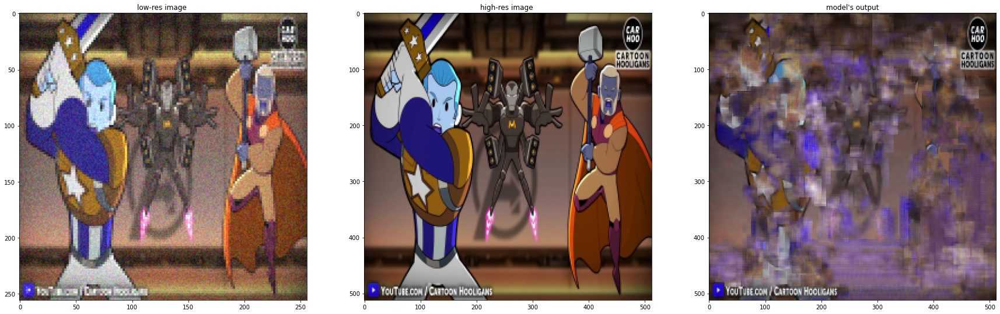

<Figure size 2880x2880 with 0 Axes>

In [7]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[100])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


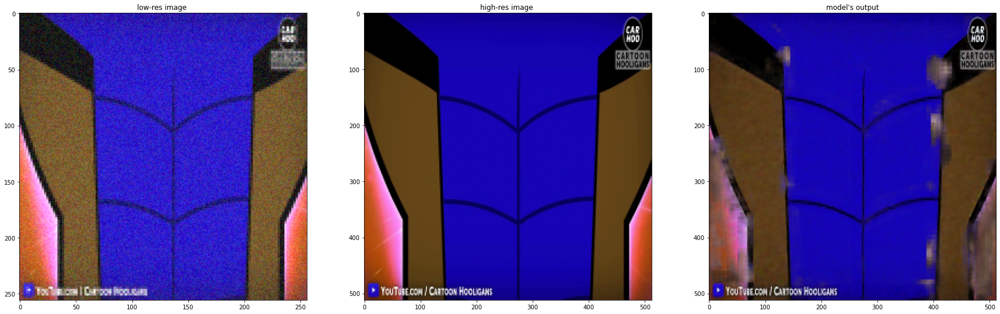

<Figure size 2880x2880 with 0 Axes>

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[200])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[200])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[200])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


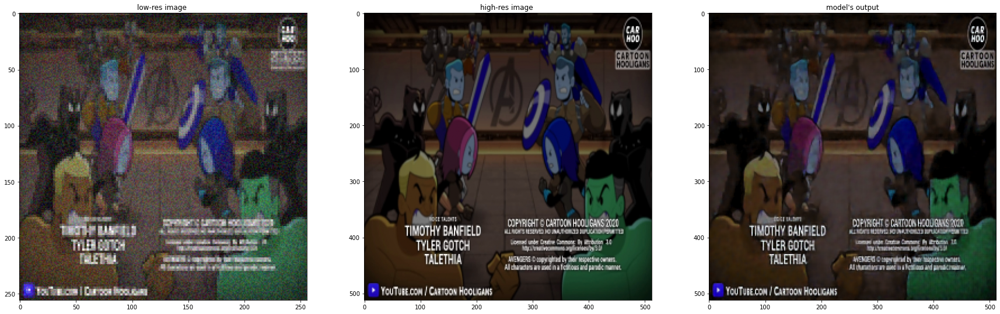

<Figure size 2880x2880 with 0 Axes>

In [9]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[50])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[50])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[50])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


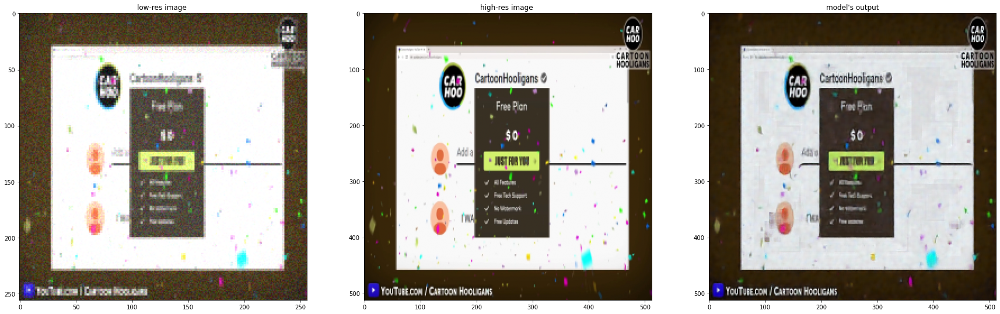

<Figure size 2880x2880 with 0 Axes>

In [10]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[70])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[70])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[70])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


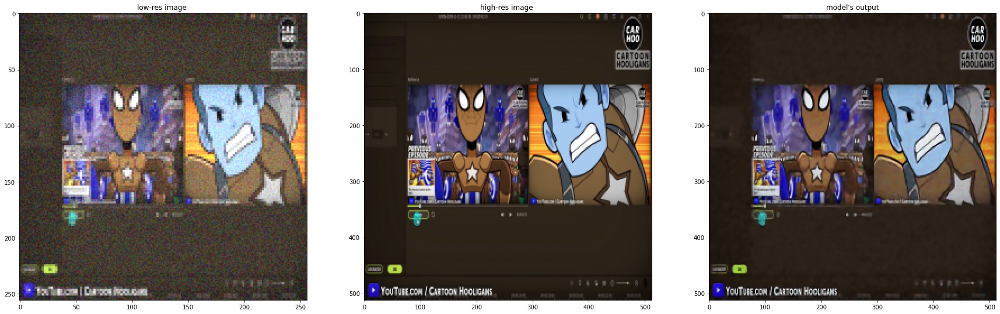

<Figure size 2880x2880 with 0 Axes>

In [11]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[30])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[30])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[30])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


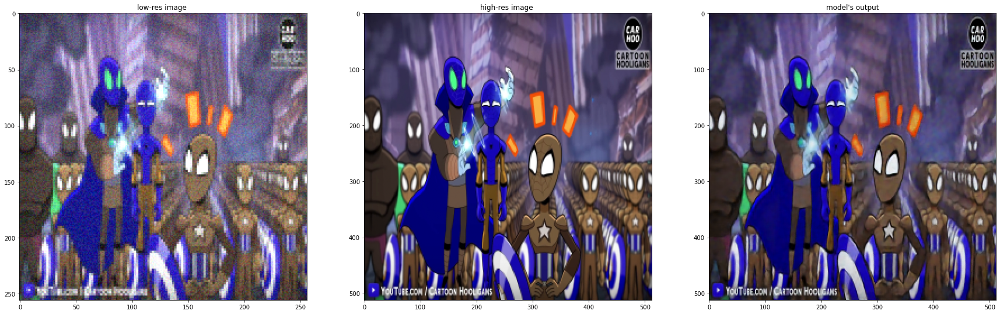

<Figure size 2880x2880 with 0 Axes>

In [12]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[35])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[35])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[35])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


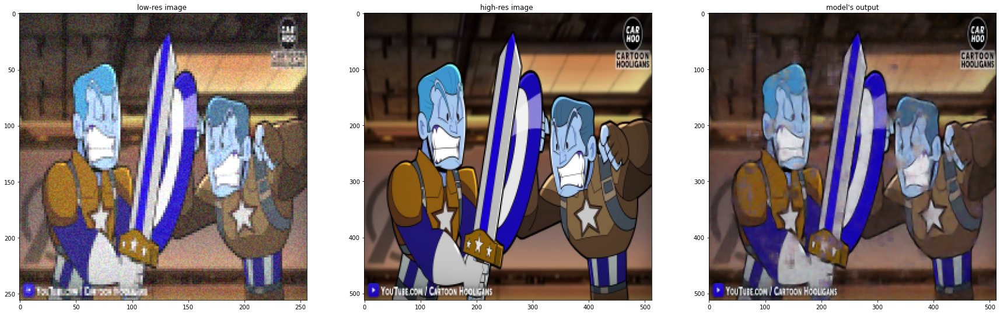

<Figure size 2880x2880 with 0 Axes>

In [13]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[120])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[120])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[120])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


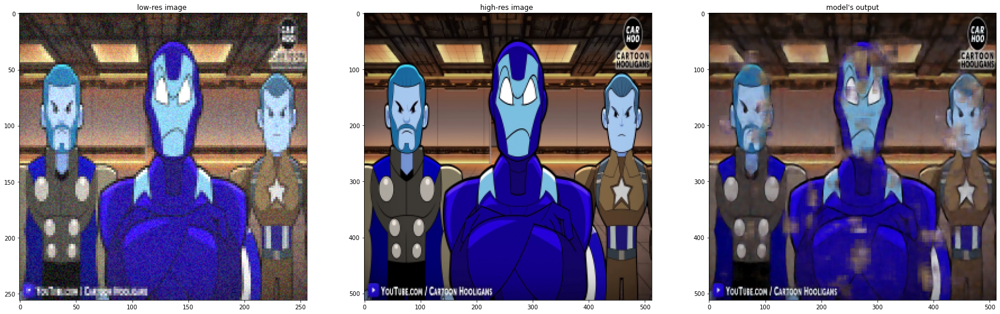

<Figure size 2880x2880 with 0 Axes>

In [14]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[170])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[170])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[170])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


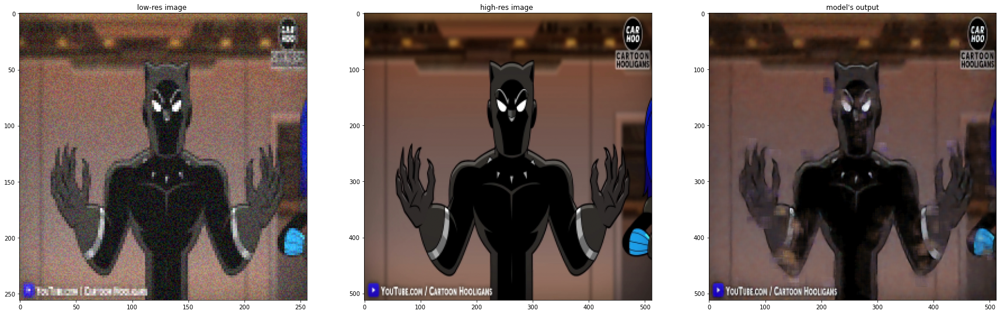

<Figure size 2880x2880 with 0 Axes>

In [15]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[179])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[179])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[179])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


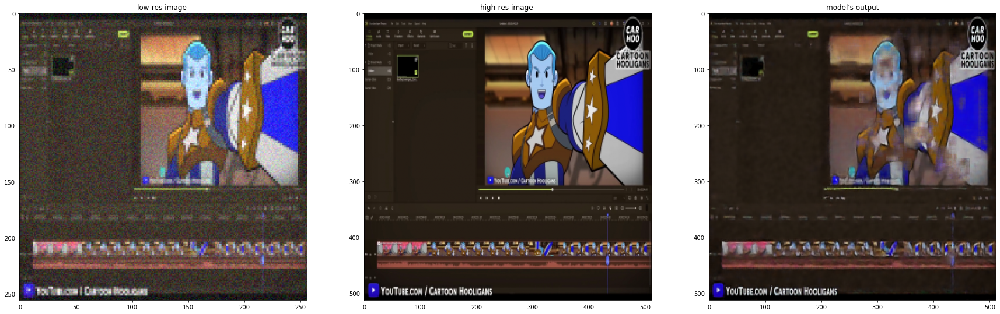

<Figure size 2880x2880 with 0 Axes>

In [17]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[210])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[210])
ax2.title.set_text("high-res image ")
ax3.imshow(ten_ten[210])
ax3.title.set_text("model's output")

In [ ]:
model_5.save('CNN_04_28_SIMS_PSNR_512_BN_Drop_TheBest')

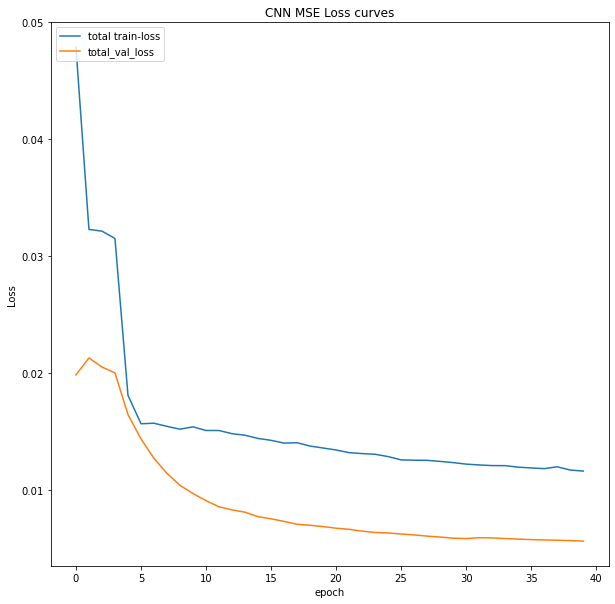

In [59]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_7.history['total_loss'])
plt.plot(history_7.history['val_val_total_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('CNN MSE Loss curves')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['total train-loss','total_val_loss'], loc='upper left')
plt.show()

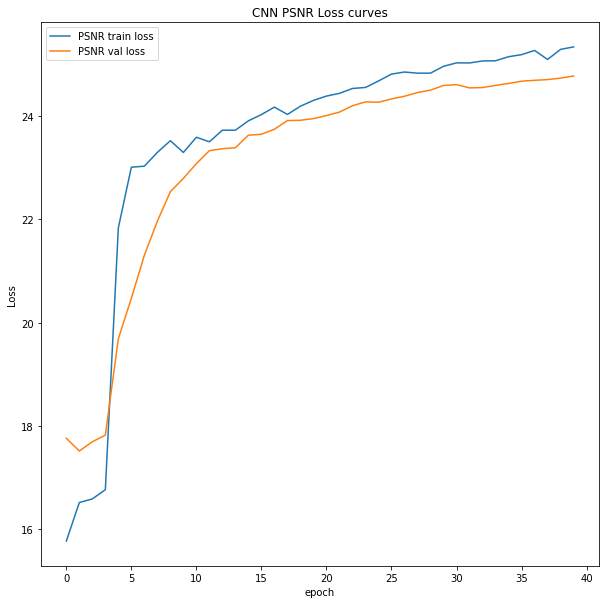

In [60]:
plt.rcParams["figure.figsize"] = (10,10)
#plt.plot(history_7.history['ssim_loss'])
plt.plot(history_7.history['psnr_loss'])
#plt.plot(history_7.history['val_val_ssim_loss'])
plt.plot(history_7.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('CNN PSNR Loss curves')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['PSNR train loss', 'PSNR val loss'], loc='upper left')
plt.show()

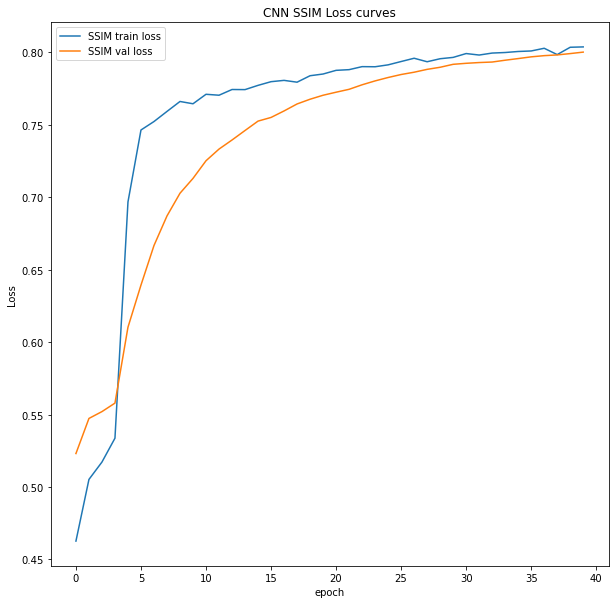

In [61]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_7.history['ssim_loss'])
#plt.plot(history_7.history['psnr_loss'])
plt.plot(history_7.history['val_val_ssim_loss'])
#plt.plot(history_7.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('CNN SSIM Loss curves')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['SSIM train loss','SSIM val loss'], loc='upper left')
plt.show()